In [1]:
!git clone https://github.com/Hassan-Tamer/pattern-Assignments.git
%cd pattern-Assignments/lab2
!git checkout multitask

Cloning into 'pattern-Assignments'...
remote: Enumerating objects: 77, done.
remote: Counting objects: 100% (77/77), done.
remote: Compressing objects: 100% (54/54), done.
remote: Total 77 (delta 25), reused 60 (delta 16), pack-reused 0 (from 0)
Receiving objects: 100% (77/77), 5.54 MiB | 25.43 MiB/s, done.
Resolving deltas: 100% (25/25), done.
/kaggle/working/pattern-Assignments/lab2
Branch 'multitask' set up to track remote branch 'multitask' from 'origin'.
Switched to a new branch 'multitask'


In [2]:
!pip install -r requirement.txt

In [3]:
!python3 main.py --batch_size 4 --datasetroot /kaggle/input/ham1000-segmentation-and-classification

Loading dataset...
Train size: 2003
Test size: 501
Using device: cuda
Downloading: "https://github.com/pytorch/vision/zipball/v0.10.0" to /root/.cache/torch/hub/v0.10.0.zip
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DeepLabV3_ResNet50_Weights.COCO_WITH_VOC_LABELS_V1`. You can also use `weights=DeepLabV3_ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/deeplabv3_resnet50_coco-cd0a2569.pth" to /root/.cache/torch/hub/checkpoints/deeplabv3_resnet50_coco-cd0a2569.pth
100%|██████

In [4]:
from model import deeplabv3_Multitask

model = deeplabv3_Multitask()

Using cache found in /root/.cache/torch/hub/pytorch_vision_v0.10.0


Total number of parameters in the model: 42,004,074


In [8]:
model.load_state_dict(torch.load(weights_path)['model_state_dict'])

/tmp/ipykernel_24/2012752039.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(weights_path)['model_state_dict'])


<All keys matched successfully>

In [12]:
from train import *

dataset_root = '/kaggle/input/ham1000-segmentation-and-classification'
train_loader , val_loader = get_dataset_loaders(dataset_root, batch_size=4)

Loading dataset...
Train size: 2003
Test size: 501


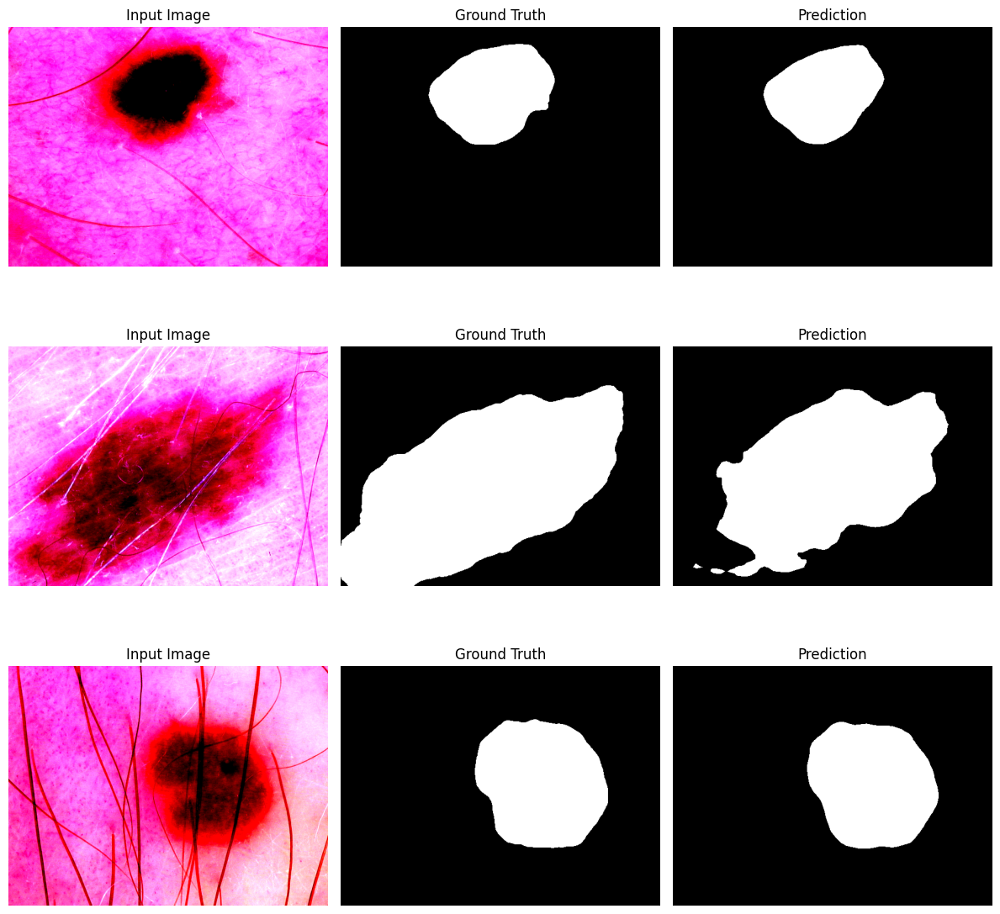

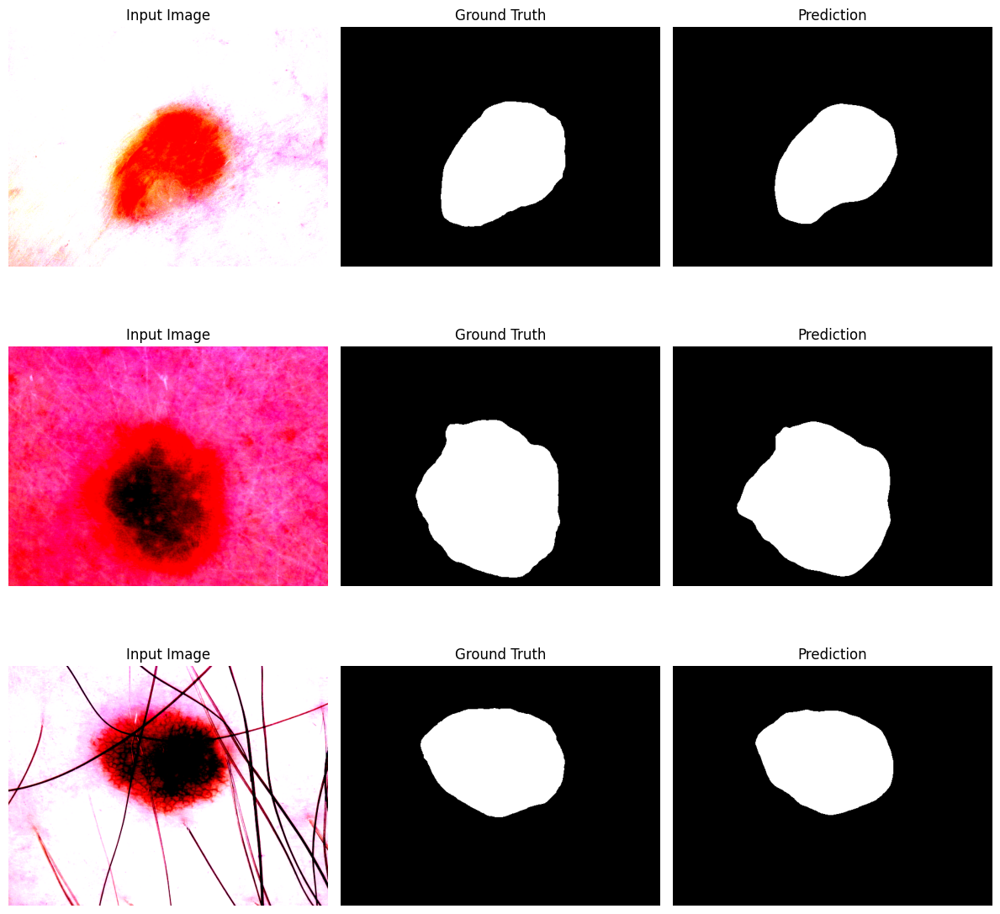

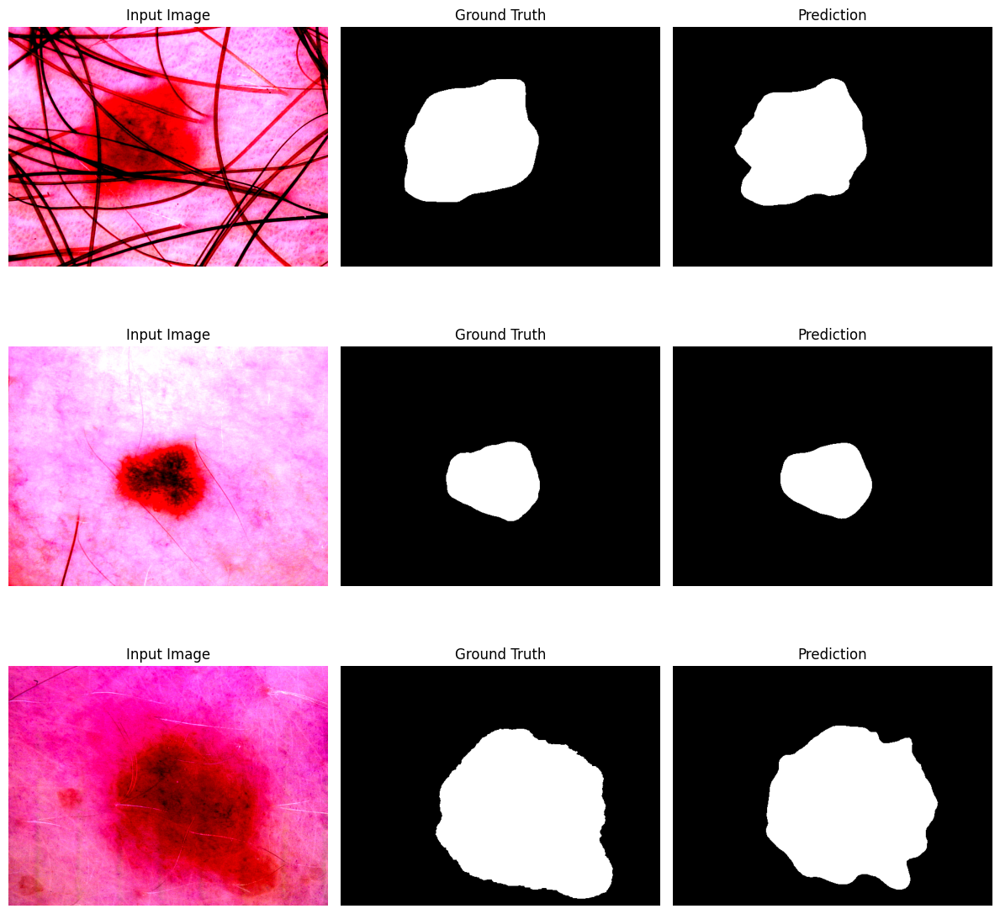

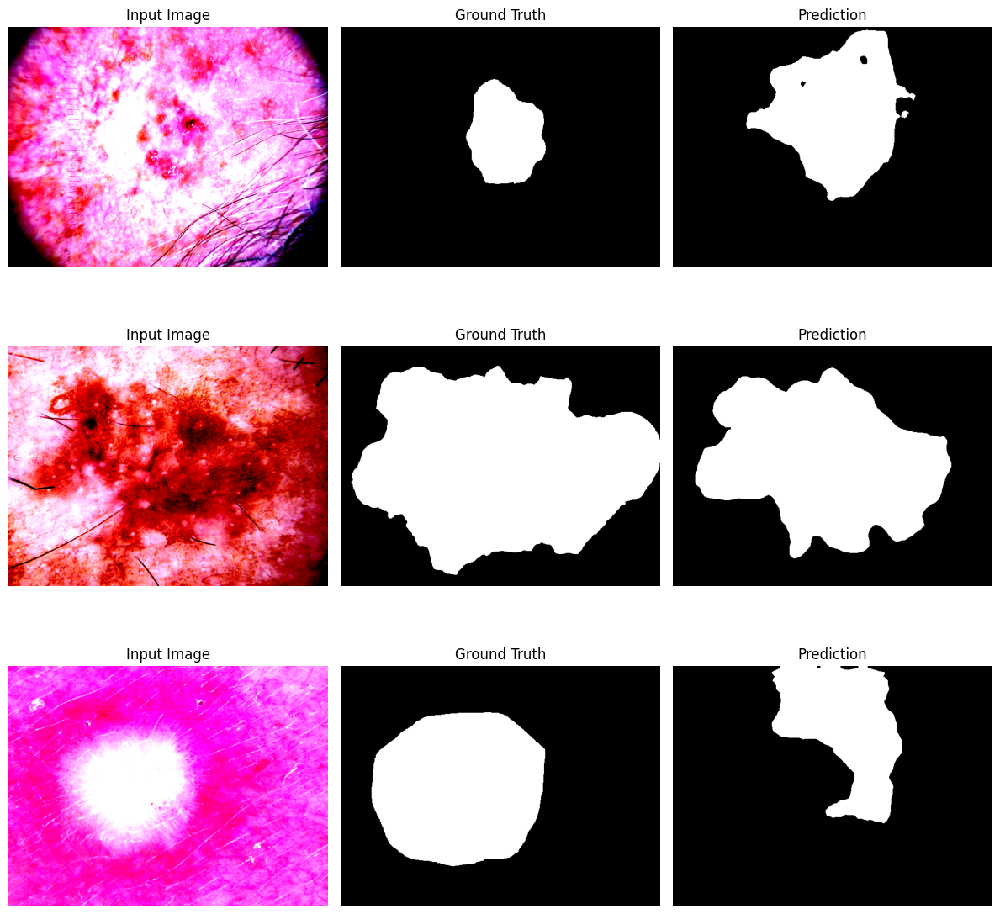

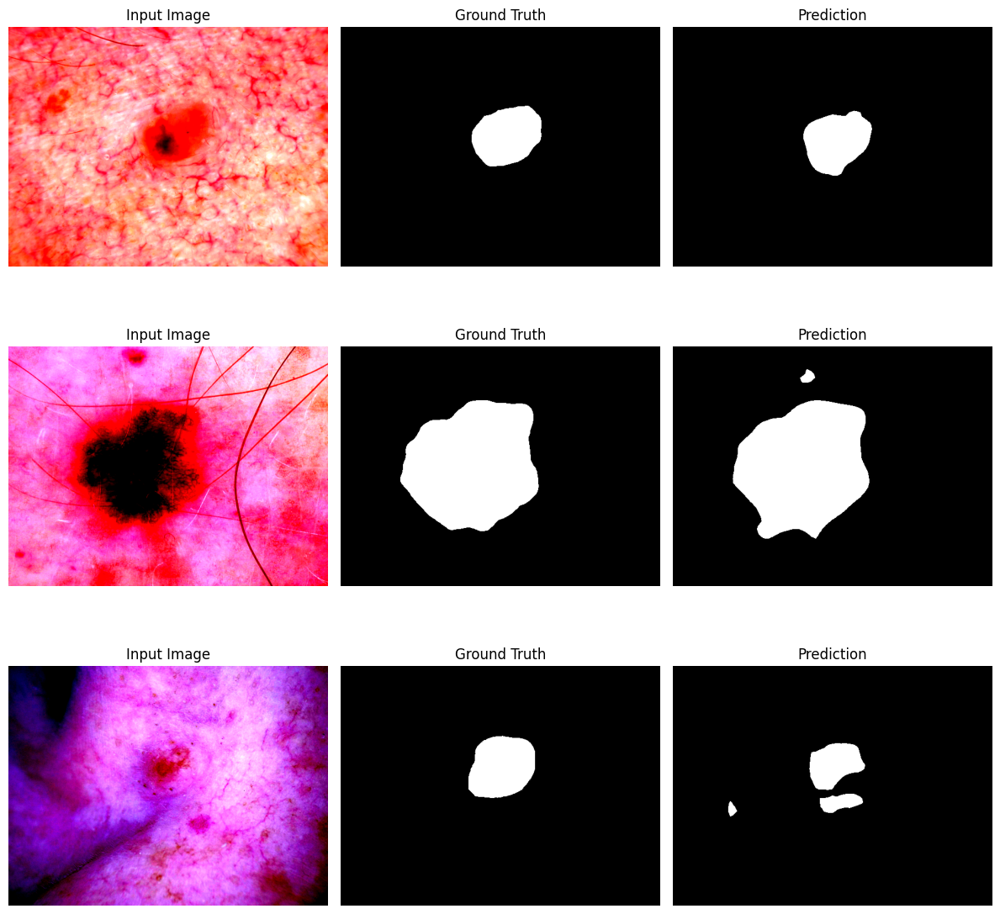

...

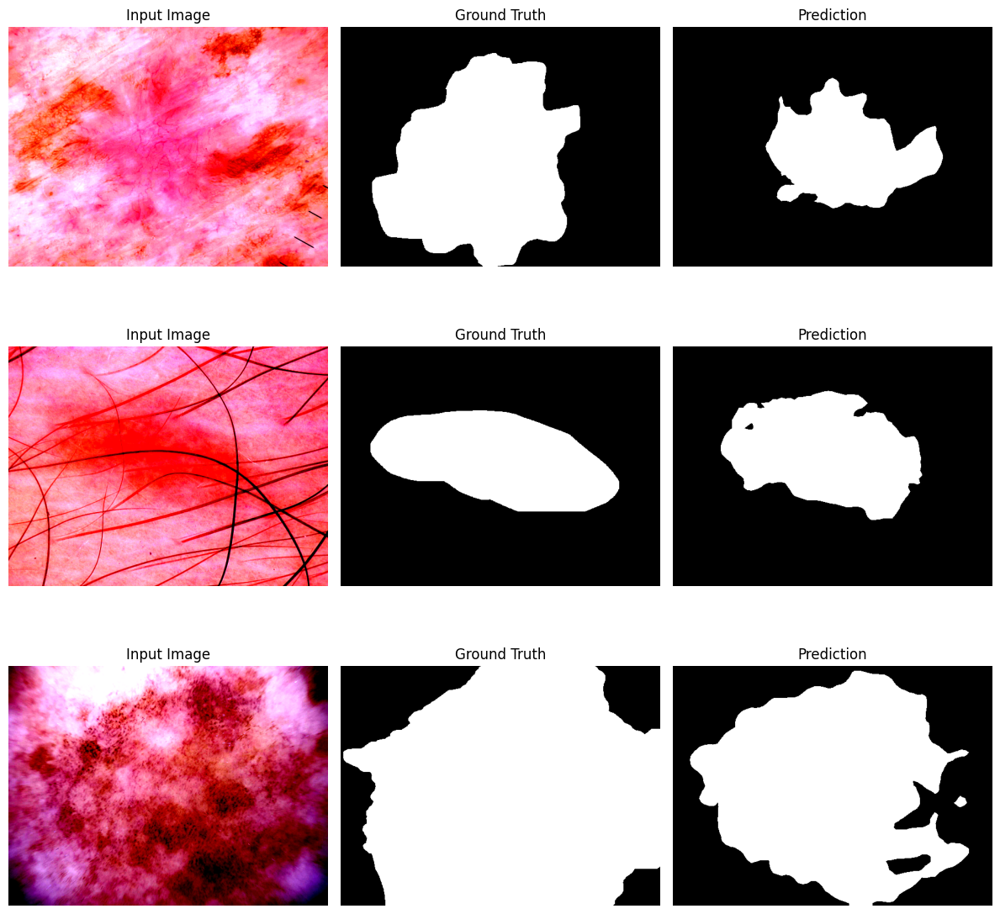

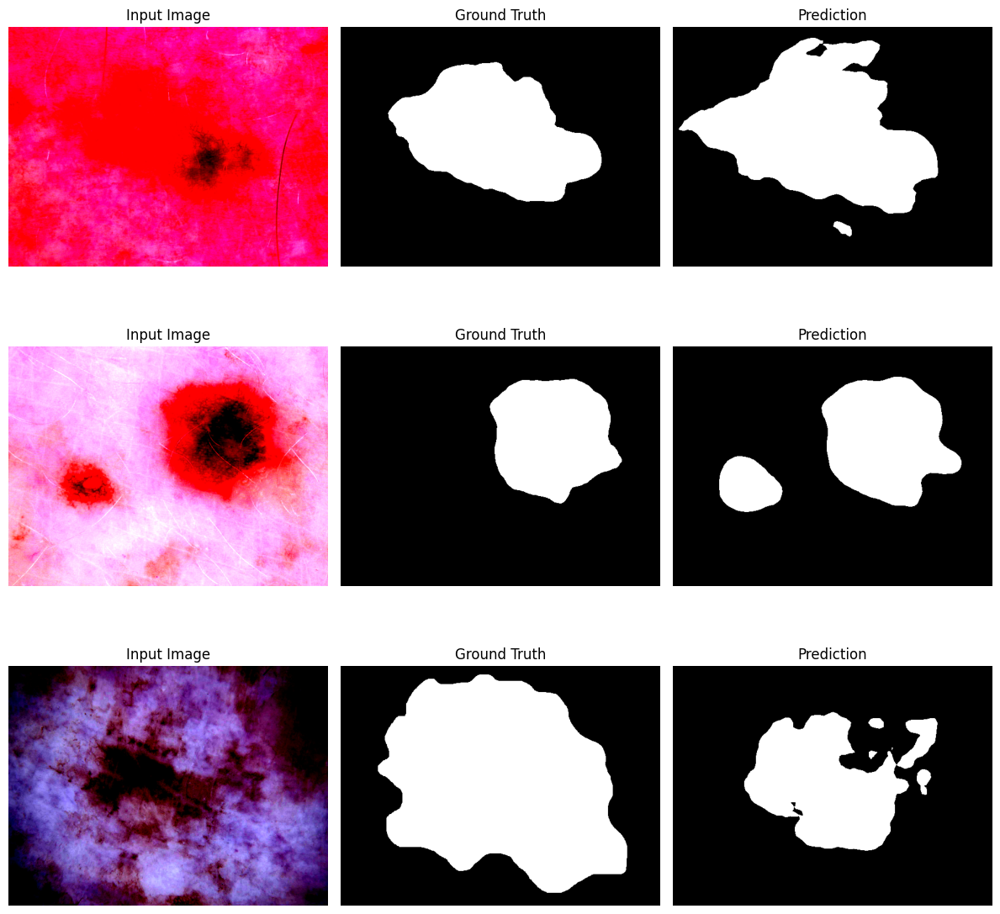

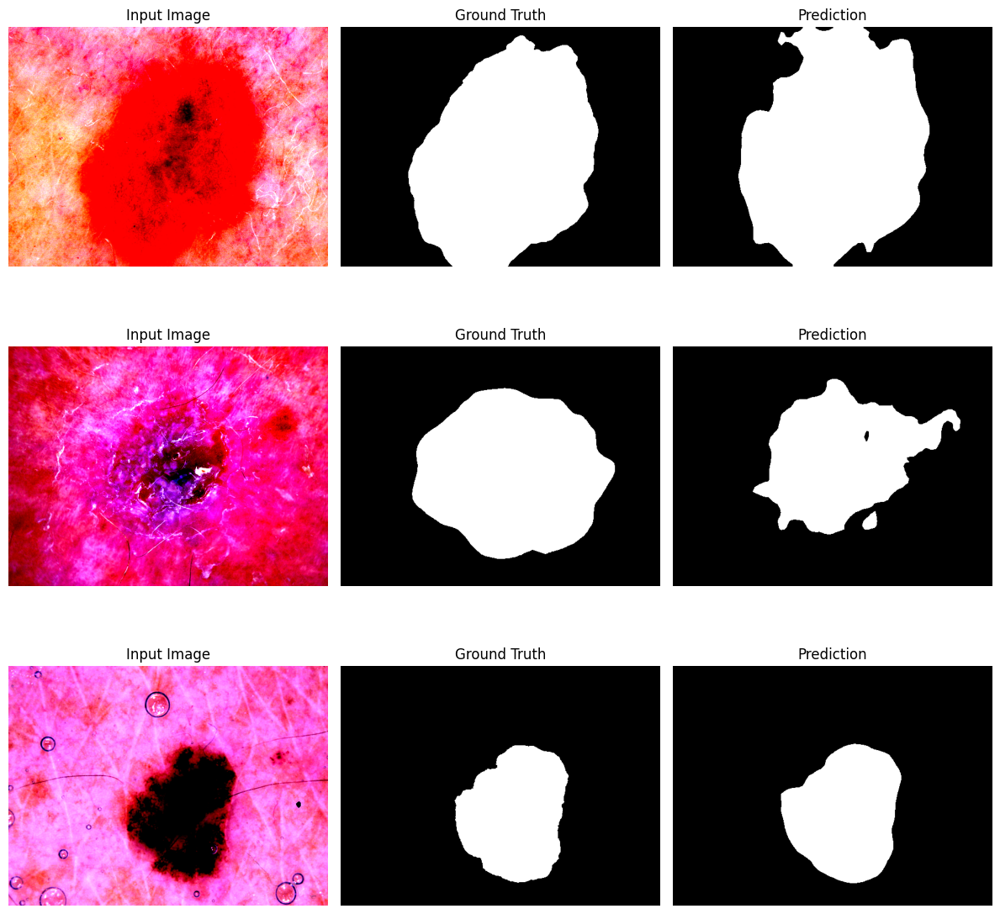

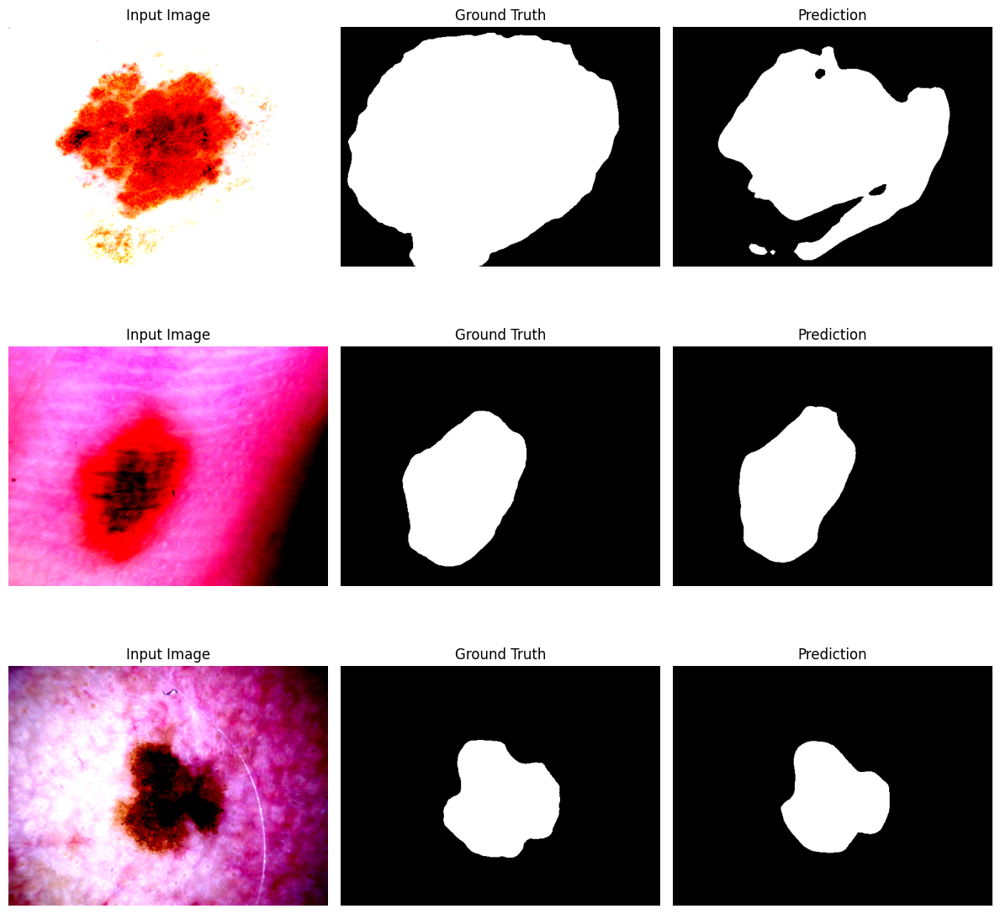

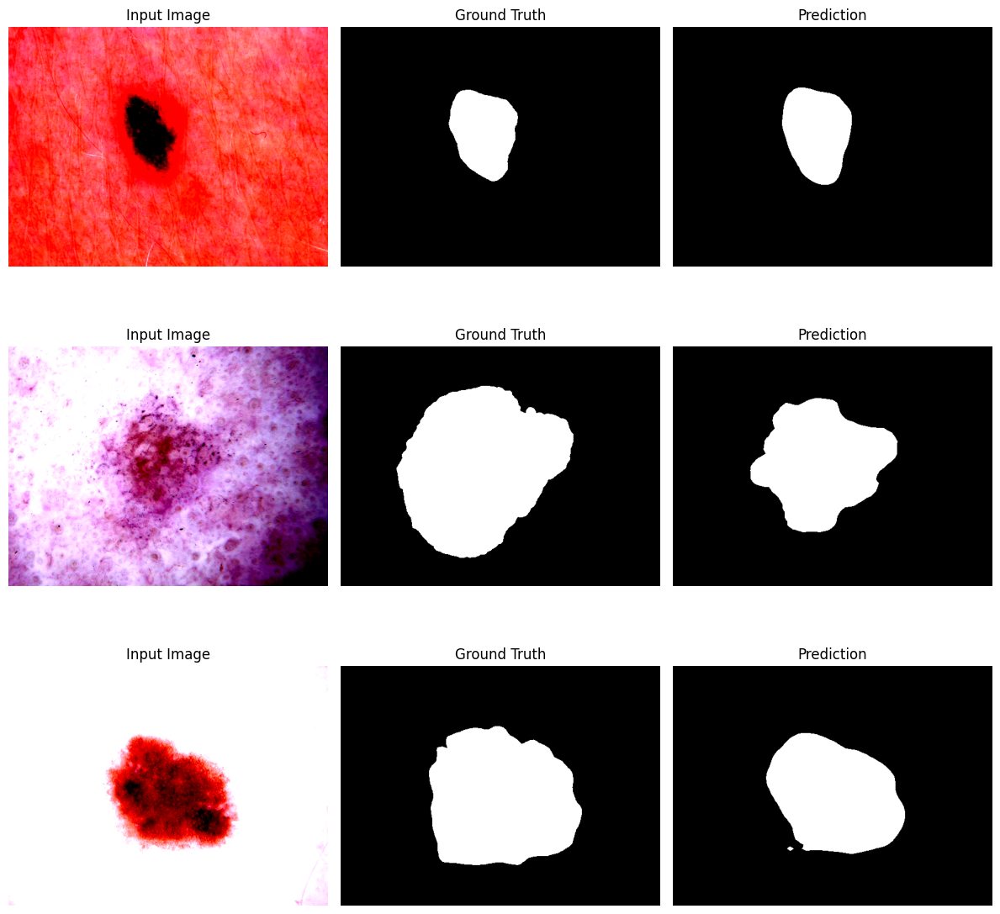

Average Dice Score: 0.8651


In [16]:
from evaluation import *
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)
evaluate_model(val_loader, model, device)

Confusion Matrix:


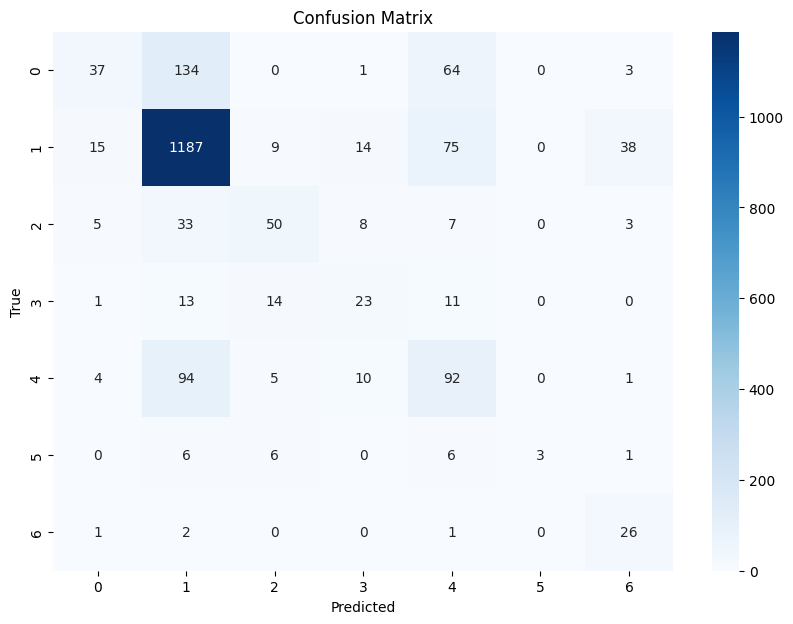

Validation Loss: 0.9009
Accuracy: 70.79%
Precision: 0.7074
Recall: 0.7079
F1-Score: 0.6853


(0.9008534740669634,
 70.7938092860709,
 0.707407342009504,
 0.707938092860709,
 0.6853435518379006,
 array([[  37,  134,    0,    1,   64,    0,    3],
        [  15, 1187,    9,   14,   75,    0,   38],
        [   5,   33,   50,    8,    7,    0,    3],
        [   1,   13,   14,   23,   11,    0,    0],
        [   4,   94,    5,   10,   92,    0,    1],
        [   0,    6,    6,    0,    6,    3,    1],
        [   1,    2,    0,    0,    1,    0,   26]]))

In [19]:
import torch.nn as nn
class_criterion = nn.CrossEntropyLoss()
evaluate_classifier(val_loader, model, device, class_criterion)